## Application of text minining in analyzing laws for Nonprofit Organization

This project I coordinated with my professor in Economics Department at LeBow College of BUsiness to perform text mining on law for Nonprofit Organization. The purpose of text mining process will idenfity which states have similar statues in merge, dissolution, asset acquisition and endownment.

In [16]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.display.max_rows = 30

### I. Create descriptive statistic tables to compare states

In [17]:
key_word = ['bond', 'Merger', 'Endowment', 'Asset', 'Dissolution']

In [18]:
def countDataByKeyWord(key_word,state_name,boolean_value):
    t_array = []
    for i in key_word:
            try:
                count = state_name[i].value_counts().loc[boolean_value]
            except:
                count = 0
            finally:
                t_array.append(count)
    return t_array

In [365]:
State_data = []
Bond_data = []
Merge_data = [] = []
Endownment_data = []
Asset_data = []
Dissolution_data = []
Bond_data_T = []
Merge_data_T = [] = []
Endownment_data_T = []
Asset_data_T = []
Dissolution_data_T = []
directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
entries = os.listdir(directory)
for entry in entries:
    if 'csv' in entry:
        state_name = pd.read_csv(directory + entry)
    elif 'tsv' in entry:
        state_name = pd.read_csv(directory + entry, delimiter="\t")
    else:
        print (false)
    word = entry.split('.')[0]
    State_data.append(word)
    temp_array = countDataByKeyWord(key_word, state_name,False)
    Bond_data.append(temp_array[0])
    Merge_data.append(temp_array[1])
    Endownment_data.append(temp_array[2])
    Asset_data.append(temp_array[3])
    Dissolution_data.append(temp_array[4])
    
    temp_array = countDataByKeyWord(key_word, state_name,True)
    Bond_data_T.append(temp_array[0])
    Merge_data_T.append(temp_array[1])
    Endownment_data_T.append(temp_array[2])
    Asset_data_T.append(temp_array[3])
    Dissolution_data_T.append(temp_array[4])

In [366]:
data = {'State': State_data, 'Bond_False': Bond_data,'Bond_True': Bond_data_T,  'Merger_False': Merge_data,'Merger_True': Merge_data_T, 'Endowment_False': Endownment_data,'Endowment_True': Endownment_data_T, 'Asset_False': Asset_data,'Asset_True': Asset_data_T, 'Dissolution_False': Dissolution_data, 'Dissolution_True': Dissolution_data_T}
df = pd.DataFrame (data, columns = ['State','Bond_False','Bond_True', 'Merger_False','Merger_True', 'Endowment_False','Endowment_True', 'Asset_False','Asset_True', 'Dissolution_False','Dissolution_True'])

In [367]:
df.shape

(50, 11)

In [368]:
df.head()

,State,Bond_False,Bond_True,Merger_False,Merger_True,Endowment_False,Endowment_True,Asset_False,Asset_True,Dissolution_False,Dissolution_True
0,alabama,92,0,85,7,92,0,88,4,83,9
1,alaska,145,2,128,19,147,0,123,24,122,25
2,arizona,577,16,538,55,592,1,534,59,511,82
3,arkansas,25,1,26,0,26,0,23,3,22,4
4,california,207,0,202,5,207,0,202,5,204,3


In [369]:
# Export to csv file
df.to_csv('Stat Data2.csv', index= False)

### II.Wordcloud visualization

In [2]:
!pip install nltk

In [4]:
import nltk

In [5]:
import re
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hangl\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hangl\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [6]:
stop_words = set(stopwords.words("english"))

In [7]:
from nltk.stem import WordNetLemmatizer
lemma = WordNetLemmatizer()

In [8]:
!pip install wordcloud

In [9]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [10]:
new_stopwords = ['ic', 'p', 'l', 'sec', 'a', 'b', 'c', 'e', 'f', 'g', 'article', 'articles', 'section', 'shall', 'may', 'must', 'ch', 'eff','ii', 'pl', 'also', 'therefor', 'ilcs', 'par', 'dec', 'xa', 'u', 'r', 's']
new_stopwords_list = stop_words.union(new_stopwords)

In [11]:
def fix_Text(text):
	letters_only = re.sub("[^a-zA-Z0-9]"," ", str(text))
	words=letters_only.lower().split()
	meaningful=[lemma.lemmatize(word) for word in words if word not in new_stopwords_list]
	return(" ".join(meaningful))

In [12]:
def fix_Text_wo_number(text):
	letters_only = re.sub("[^a-zA-Z]"," ", str(text))
	words=letters_only.lower().split()
	meaningful=[lemma.lemmatize(word) for word in words if word not in new_stopwords_list]
	return(" ".join(meaningful))

In [13]:
def computeTF(text_wc):
    tfDict = {}
    str_list = text_wc.split() 
    unique_words = set(str_list)
    for words in unique_words : 
        tfDict[words] = str_list.count(words)/len(str_list)
    return tfDict

In [23]:
def printTopWordAllState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['Law', key_word])
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['Law', key_word]])
        
    clean_text = key_word_df.Law.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
    df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
    array = df.Word
    #dict_data.update({word:array})
    for i in sort_orders[:20]:
        print(i[0], i[1]) 

In [24]:
printTopWordAllState("Merger")

corporation 0.04147593808347889
merger 0.017538246100102392
state 0.0161416611455761
director 0.012305757995542975
member 0.011477594410648677
act 0.009136150093356622
foreign 0.008620430042763355
name 0.008499969884960549
person 0.008025658013611998
plan 0.007946606035053906
limited 0.007931548515328556
business 0.007852496536770464
law 0.007630398120821539
entity 0.007306661446726495
secretary 0.006911401553936035
share 0.006873757754622659
added 0.0063505089441667165
domestic 0.006233813166295248
liability 0.006199933746913209
certificate 0.006030536650003012


In [25]:
def getTopWordAllState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['Law', key_word])
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['Law', key_word]])
        
    clean_text = key_word_df.Law.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
    df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
    array = df.Word
    return array

In [27]:
def WordCloudAllState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['Law', key_word])
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['Law', key_word]])
        
    clean_text = key_word_df.Law.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    wordcloud = WordCloud(background_color="black", collocations=False).generate(text_wc)
    plt.figure(figsize = (14, 13))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show() 

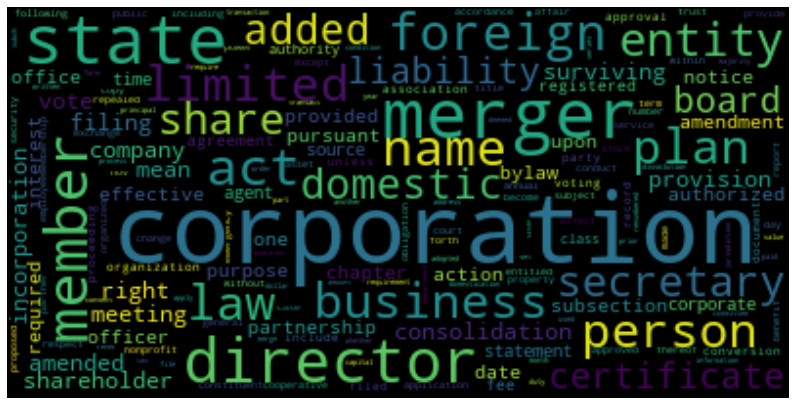

In [28]:
WordCloudAllState("Merger")

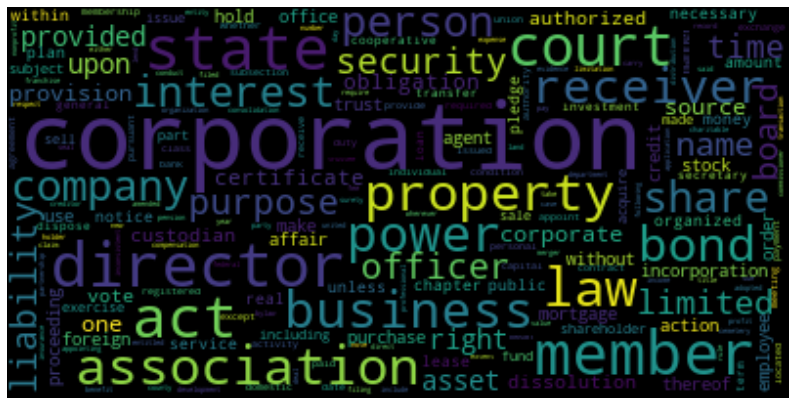

In [29]:
WordCloudAllState("bond")

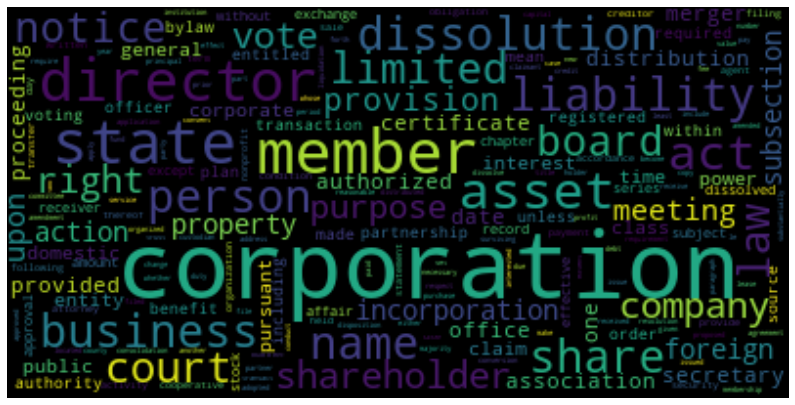

In [30]:
WordCloudAllState("Asset")

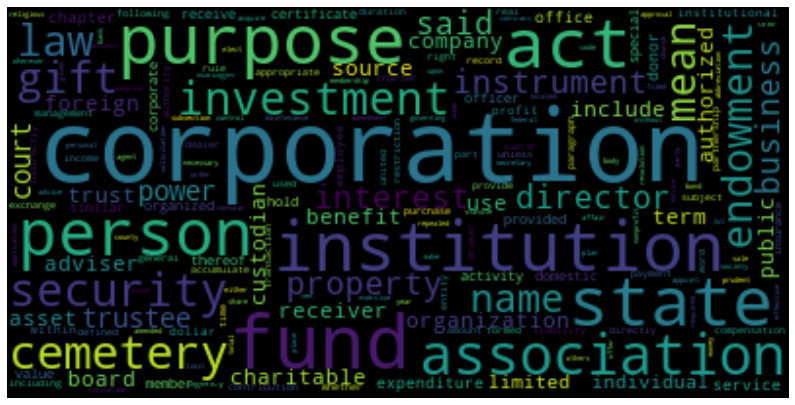

In [31]:
WordCloudAllState("Endowment")

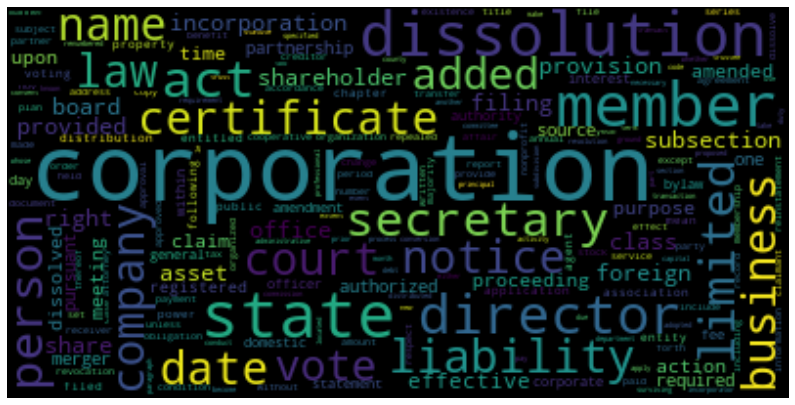

In [32]:
WordCloudAllState("Dissolution")

# III. Correlation

## Merger - All States

In [33]:
def compareTwoStates(state1,state2):
    similarity = set(state1) & set(state2)
    return len(similarity)/10

In [41]:
def getTopTenWordForEachState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    #df = pd.DataFrame(columns=['State_Name', 'TopTen'])
    dict_data = {}
    sort_orders = {}
    array = []
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
            word = entry.split('.')[0]
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
            word = entry.split('.')[0]
        else:
            print (false)
        
        state_name = state_name.rename(columns={'4':'Law'})
        state_name = state_name.loc[state_name[key_word] == True, ['Law', key_word]]
        clean_text = state_name.Law.apply(fix_Text_wo_number)
        text_wc = " ".join(item for item in clean_text)
        sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
        df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
        array = df.Word
        #df2 = pd.DataFrame([[entry,sort_orders[:10]]], columns=['State_Name', 'TopTen'])
        #df = df.append(df2, ignore_index=True)
        dict_data.update({word:array})
    return dict_data

In [42]:
def createMatrix_1(data,top_ten):
    matrix = np.zeros((50,1))
    i = 0
    for key in data.keys():
        matrix[i][0] = compareTwoStates(data[key],top_ten)
        i=i+1
    return matrix

In [43]:
def plotData_1(key_word):
    import numpy as np
    import matplotlib
    import matplotlib.pyplot as plt

    state_name = []
    for key in dict_data.keys():
        state_name.append(key)


    fig, ax = plt.subplots(figsize=(20,20))
    im = ax.imshow(correlation_matrix)

    # We want to show all ticks...
    ax.set_xticks(np.arange(len(state_name)))
    ax.set_yticks(np.arange(len(state_name)))
    # ... and label them with the respective list entries
    ax.set_xticklabels(state_name)
    ax.set_yticklabels(state_name)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    for i in range(len(state_name)):
        for j in range(len(state_name)):
            text = ax.text(j, i, correlation_matrix[i, j],
                           ha="center", va="center", color="w")

    ax.set_title("Correlation heatmap for all states - " + key_word, fontsize=25)
    fig.tight_layout()
    plt.show()

In [44]:
dict_data = getTopTenWordForEachState("Merger")

In [46]:
top_ten = getTopWordAllState('Merger')

In [47]:
#compareTwoStatesList = []
#statenameList = []
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

            state  correlation
0         alabama          0.3
1          alaska          0.6
2         arizona          0.6
3        arkansas          0.0
4      california          0.2
..            ...          ...
45       virginia          0.6
46     washington          0.6
47  west-virginia          0.8
48      wisconsin          0.6
49        wyoming          0.8

[50 rows x 2 columns]


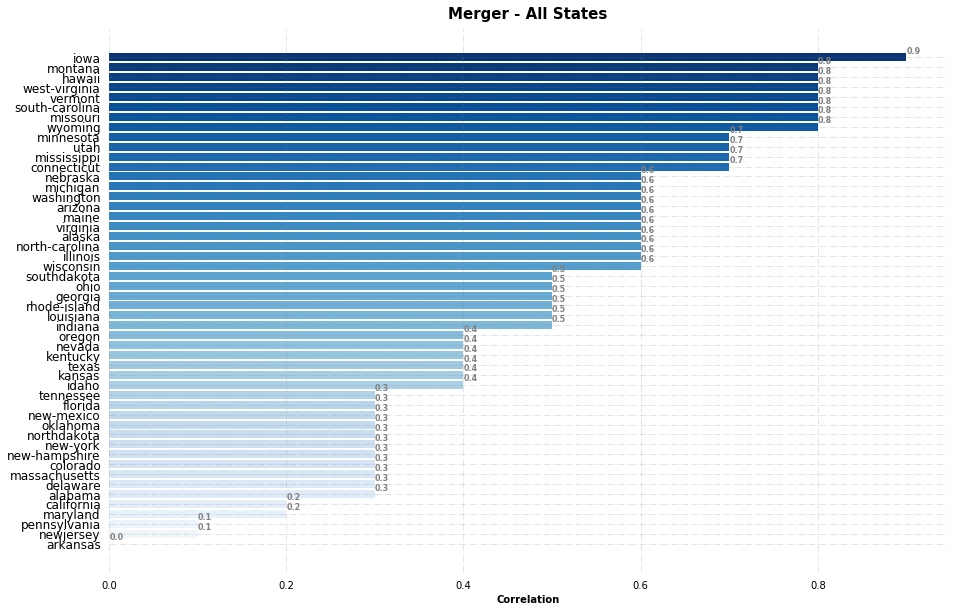

In [48]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Merger - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Bond - All States

In [49]:
printTopWordAllState("bond")

corporation 0.03285986561121854
director 0.011560774057122188
state 0.011366007707182704
member 0.010823444303779859
act 0.009919171964775115
court 0.009209665975709854
law 0.007860213408272004
association 0.007748918351163729
property 0.007540240119085711
power 0.007220266829899417
business 0.007011588597821399
bond 0.006608144015803898
otherwise 0.0065803202515268295
receiver 0.006566408369388294
company 0.006065580612401052
person 0.0058012548517688955
interest 0.005787342969630361
share 0.005703871676799154
security 0.005703871676799154
liability 0.005662136030383551


In [50]:
dict_data = getTopTenWordForEachState("bond")

In [51]:
top_ten = getTopWordAllState('bond')

In [52]:
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

            state  correlation
0         alabama          0.0
1          alaska          0.4
2         arizona          0.6
3        arkansas          0.3
4      california          0.0
..            ...          ...
45       virginia          0.3
46     washington          0.3
47  west-virginia          0.5
48      wisconsin          0.6
49        wyoming          0.5

[50 rows x 2 columns]


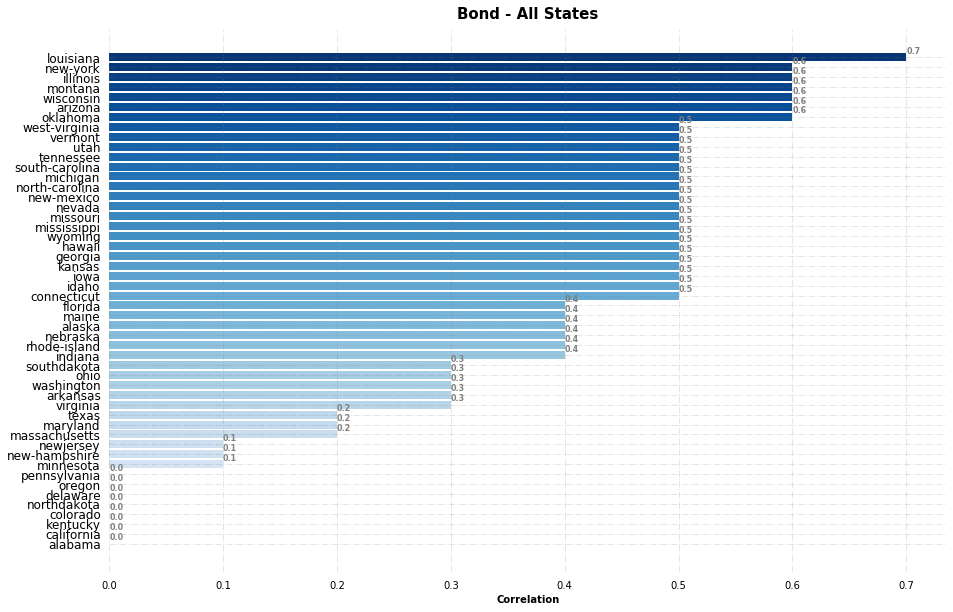

In [53]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Bond - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Endownment  - All States

In [54]:
printTopWordAllState("Endowment")

corporation 0.027946810908271353
fund 0.013860716700473293
act 0.012057696641875141
institution 0.011494252873563218
state 0.011381564119900834
purpose 0.011268875366238449
person 0.00980392156862745
association 0.009691232814965067
cemetery 0.009691232814965067
investment 0.00901510029299076
security 0.008677034032003606
law 0.0080009015100293
gift 0.007662835249042145
endowment 0.007099391480730223
mean 0.007099391480730223
name 0.006535947712418301
property 0.006310570205093531
interest 0.006197881451431147
director 0.005972503944106378
instrument 0.005972503944106378


In [55]:
dict_data = getTopTenWordForEachState("Endowment")

In [56]:
top_ten = getTopWordAllState('Endowment')

In [57]:
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

            state  correlation
0         alabama          0.0
1          alaska          0.0
2         arizona          0.2
3        arkansas          0.0
4      california          0.0
..            ...          ...
45       virginia          0.0
46     washington          0.0
47  west-virginia          0.0
48      wisconsin          0.0
49        wyoming          0.0

[50 rows x 2 columns]


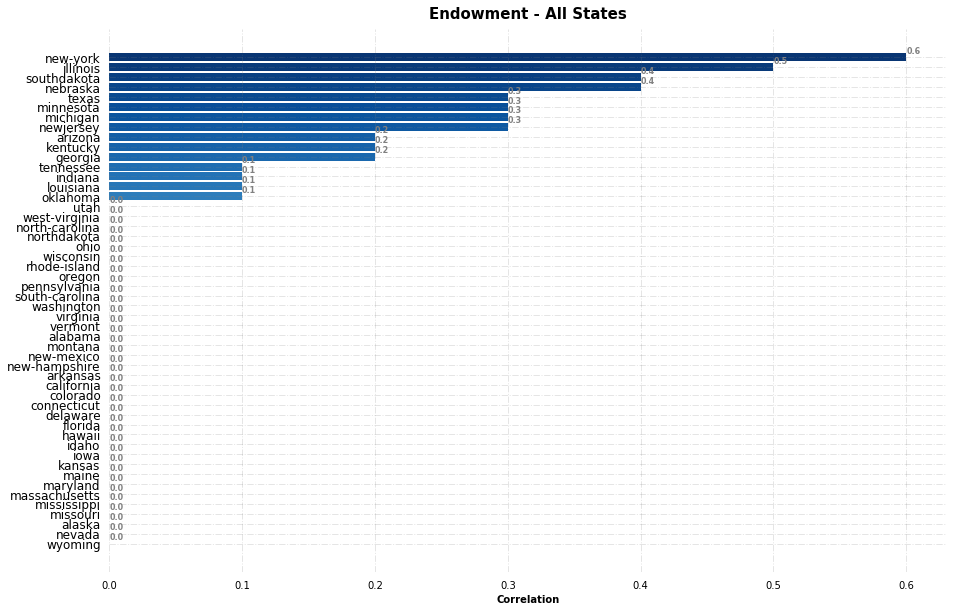

In [58]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Endowment - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Asset - All States

In [59]:
printTopWordAllState("Asset")

corporation 0.04198009116827473
member 0.014275244430842582
state 0.013502085917239825
director 0.012708793067345328
asset 0.010260457774269928
act 0.008665818339964241
person 0.007477892498751671
dissolution 0.00735708648100124
share 0.007328898410192806
liability 0.0071678237198588984
business 0.006962453489683166
name 0.006922184817099689
court 0.006543659294815006
law 0.006483256285939791
limited 0.006447014480614661
board 0.006008085949454762
notice 0.005806742586537377
company 0.005762447046695552
shareholder 0.005734258975887119
right 0.0057262052413704235


In [60]:
dict_data = getTopTenWordForEachState("Asset")
top_ten = getTopWordAllState('Asset')
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

            state  correlation
0         alabama          0.3
1          alaska          0.5
2         arizona          0.7
3        arkansas          0.2
4      california          0.3
..            ...          ...
45       virginia          0.5
46     washington          0.5
47  west-virginia          0.5
48      wisconsin          0.4
49        wyoming          0.6

[50 rows x 2 columns]


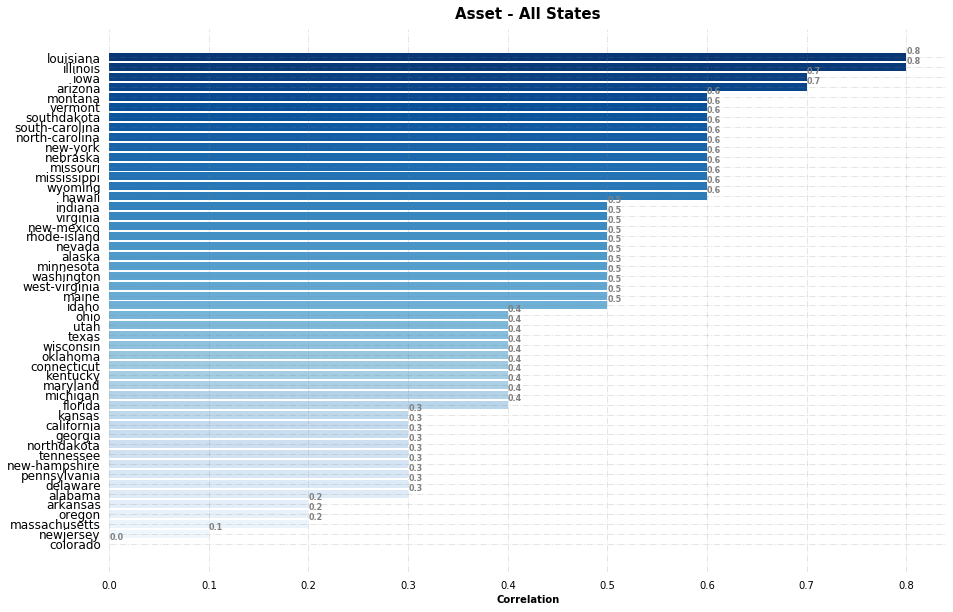

In [61]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Asset - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Dissolution  - All States

In [62]:
printTopWordAllState("Dissolution")

corporation 0.04146836958062332
state 0.015867966424668103
member 0.01457660750563001
dissolution 0.013770295595206223
director 0.011036394273925573
act 0.009861572623190916
limited 0.00805996944833777
secretary 0.008000125986236003
person 0.0077103576434274556
liability 0.007244208570213704
certificate 0.0065733318634939135
company 0.006519787713192334
notice 0.006519787713192334
name 0.006488291154191405
court 0.006409549756689082
date 0.006182774531882392
business 0.006173325564182113
law 0.006141829005181184
vote 0.005533945416463251
added 0.005486700577961858


In [63]:
dict_data = getTopTenWordForEachState("Dissolution")
top_ten = getTopWordAllState('Dissolution')
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

            state  correlation
0         alabama          0.2
1          alaska          0.4
2         arizona          0.4
3        arkansas          0.3
4      california          0.3
..            ...          ...
45       virginia          0.4
46     washington          0.4
47  west-virginia          0.6
48      wisconsin          0.4
49        wyoming          0.6

[50 rows x 2 columns]


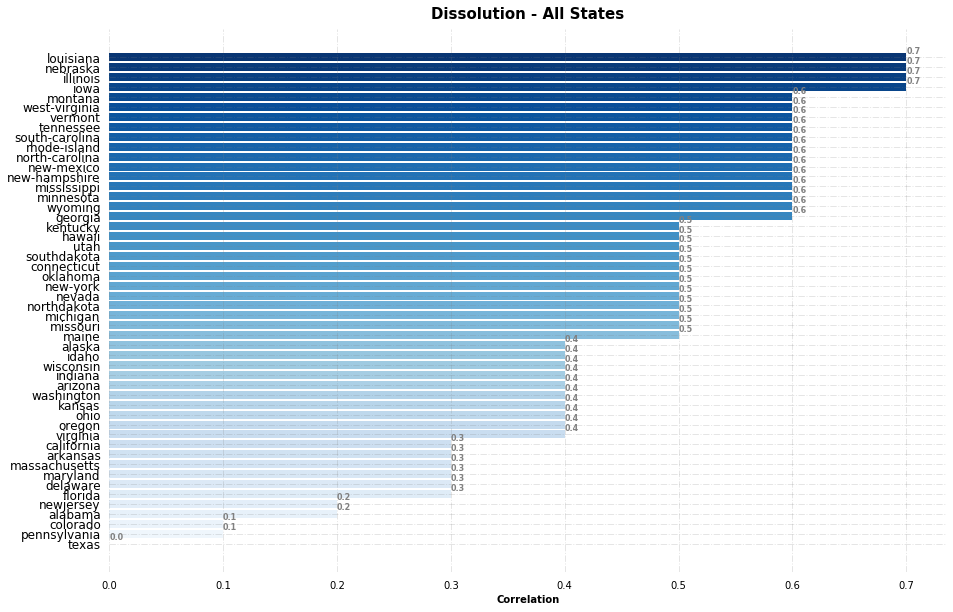

In [64]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Dissolution - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

In [ ]:
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

In [414]:
def createMatrix(data):
    matrix = np.zeros((50,50))
    i = 0
    j = 0
    for key in data.keys():
        for key1 in data.keys():
                matrix[i][j] = compareTwoStates(data[key],data[key1])
                j = j + 1
        i=i+1
        j=0
    return matrix

In [131]:
def plotData(key_word):
    import numpy as np
    import matplotlib
    import matplotlib.pyplot as plt

    state_name = []
    for key in dict_data.keys():
        state_name.append(key)


    fig, ax = plt.subplots(figsize=(20,20))
    im = ax.imshow(correlation_matrix)

    # We want to show all ticks...
    ax.set_xticks(np.arange(len(state_name)))
    ax.set_yticks(np.arange(len(state_name)))
    # ... and label them with the respective list entries
    ax.set_xticklabels(state_name)
    ax.set_yticklabels(state_name)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    for i in range(len(state_name)):
        for j in range(len(state_name)):
            text = ax.text(j, i, correlation_matrix[i, j],
                           ha="center", va="center", color="w")

    ax.set_title("Correlation heatmap for all states - " + key_word, fontsize=25)
    fig.tight_layout()
    plt.show()

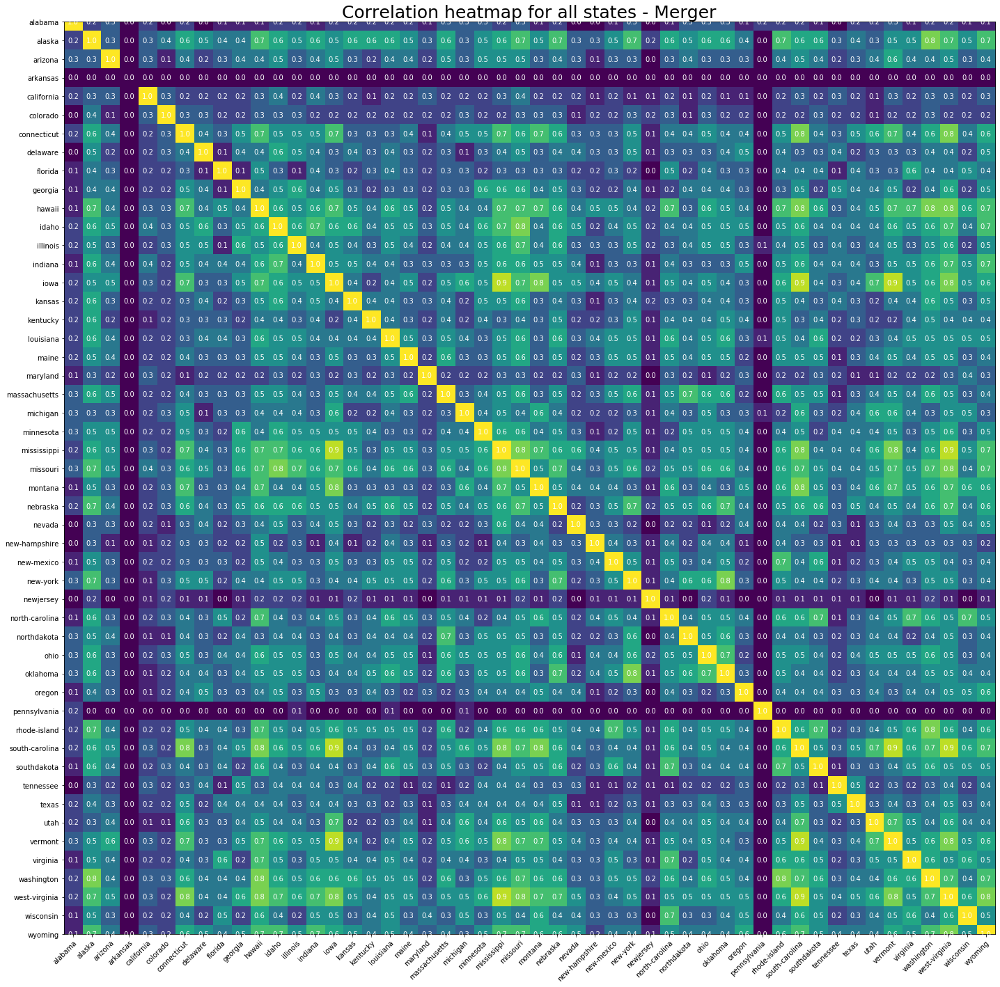

In [423]:
dict_data = getTopTenWordForEachState("Merger")
correlation_matrix = createMatrix(dict_data)
plotData("Merger")

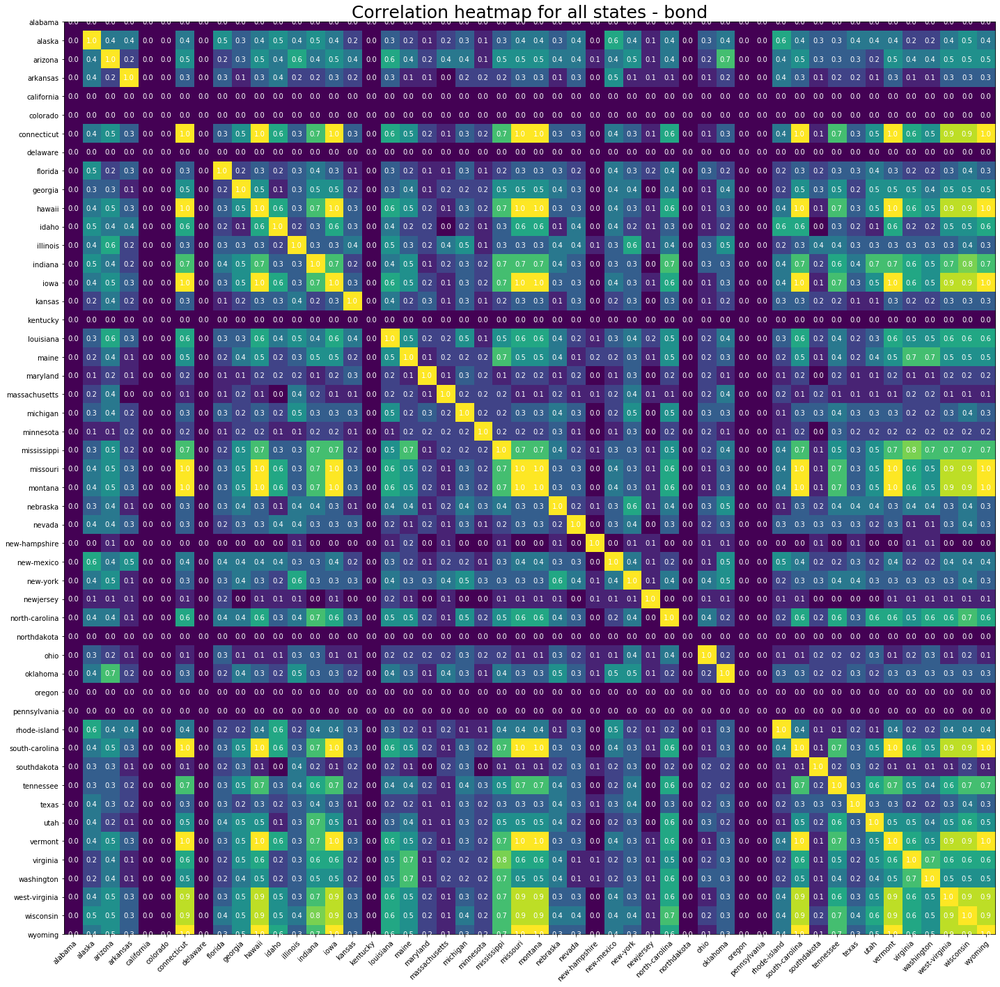

In [424]:
dict_data = getTopTenWordForEachState("bond")
correlation_matrix = createMatrix(dict_data)
plotData('bond')

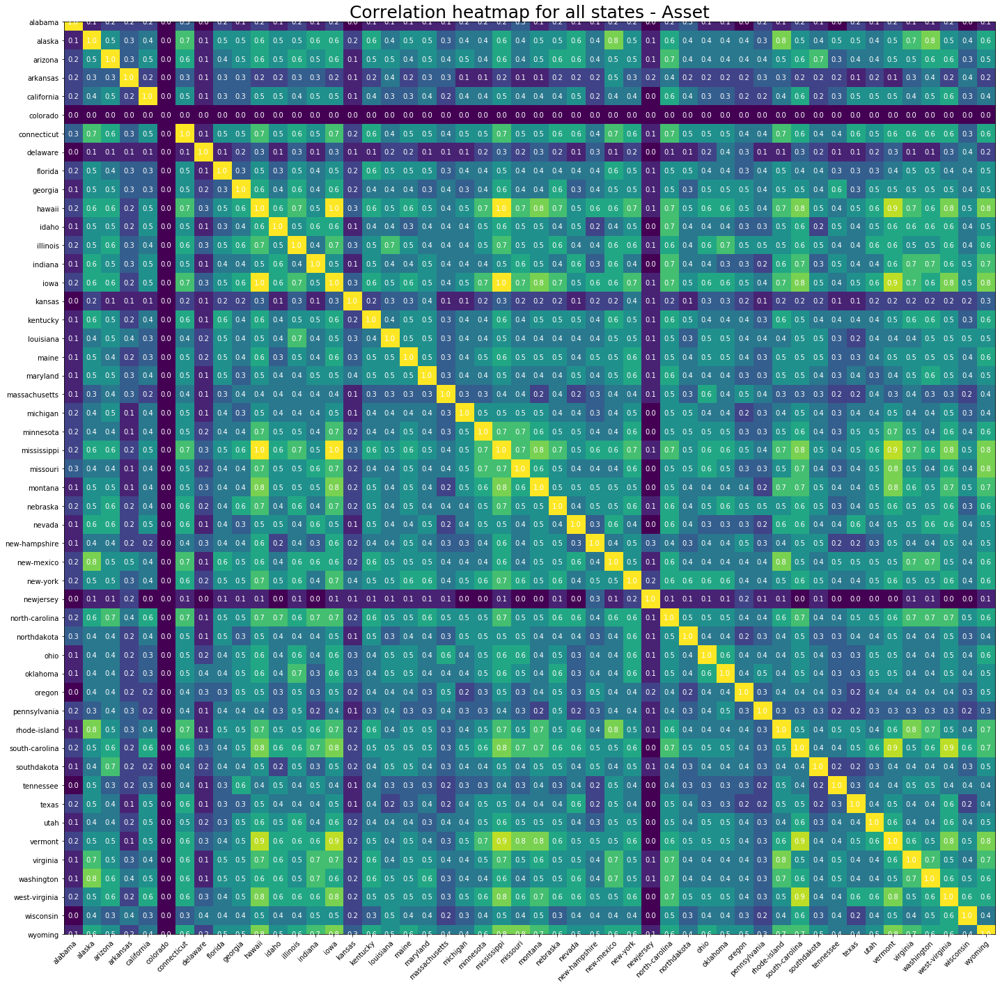

In [425]:
dict_data = getTopTenWordForEachState("Asset")
correlation_matrix = createMatrix(dict_data)
plotData('Asset')

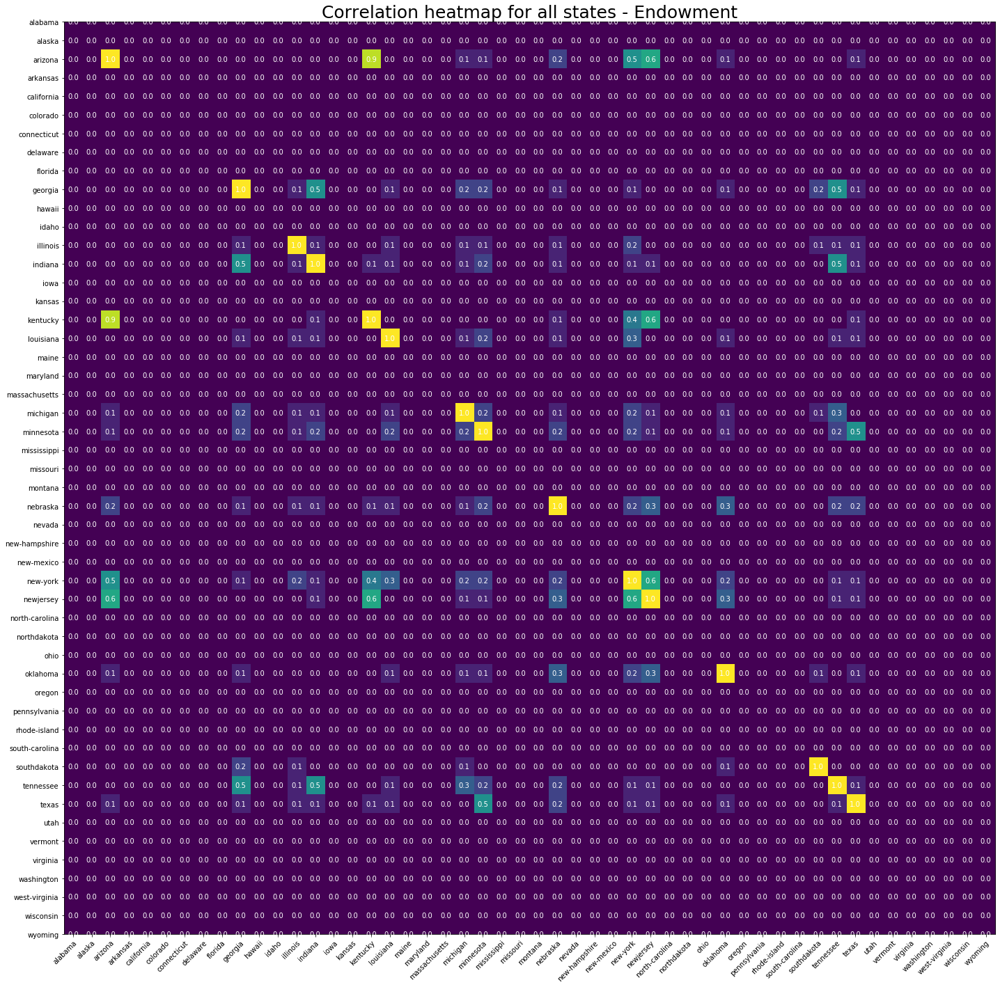

In [426]:
dict_data = getTopTenWordForEachState("Endowment")
correlation_matrix = createMatrix(dict_data)
plotData('Endowment')

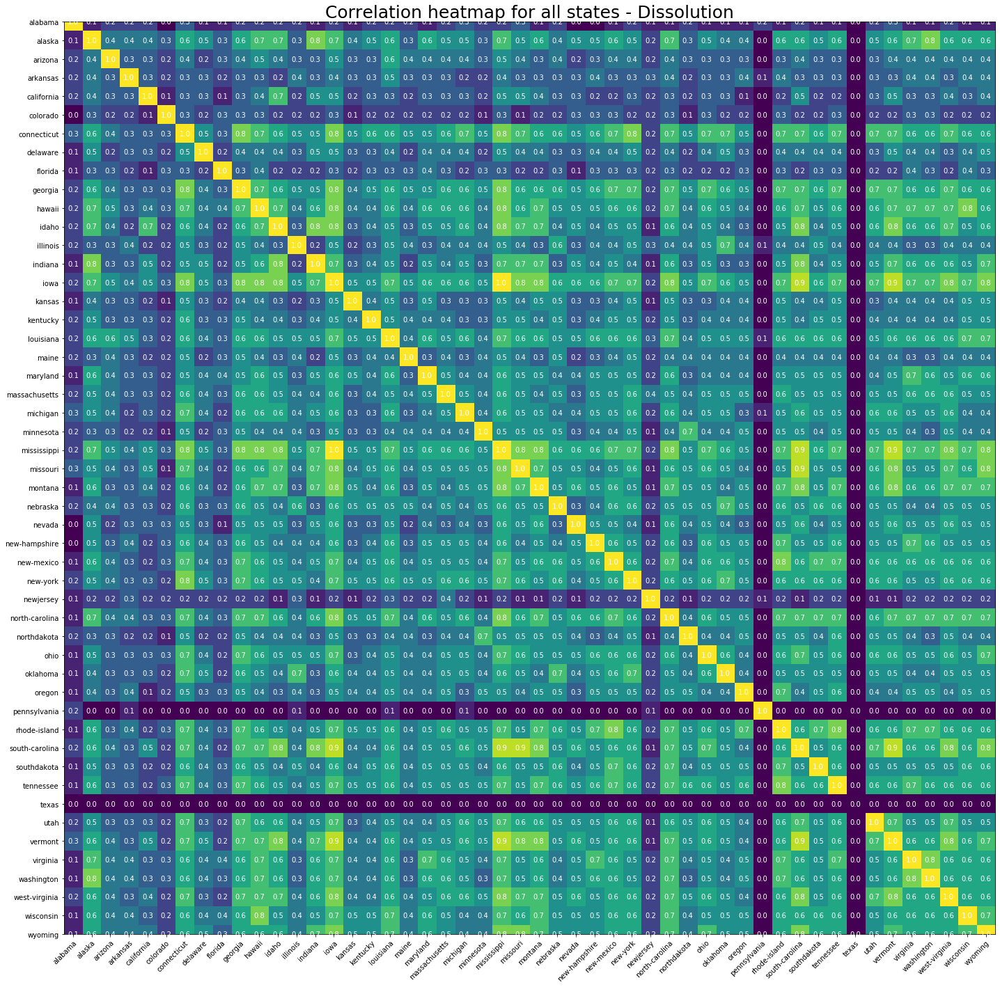

In [427]:
dict_data = getTopTenWordForEachState("Dissolution")
correlation_matrix = createMatrix(dict_data)
plotData('Dissolution')

# IV. Create Data Files


In [283]:
def mergedataclean(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['State','Law', key_word])
    for entry in entries:
        print(entry)
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        state_name['State'] = entry.split('.')[0]
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['State', 'Article','Law', key_word]])
        key_word_df['Law'] = key_word_df.Law.apply(fix_Text)
    return key_word_df

In [110]:
df = mergedataclean('Merger')
print(df)

alabama.csv
alaska.csv
arizona.csv
arkansas.tsv
california.csv
colorado.csv
connecticut.tsv
delaware.csv
florida.tsv
georgia.csv
hawaii.tsv
idaho.tsv
illinois.tsv
indiana.csv
iowa.csv
kansas.tsv
kentucky.csv
louisiana.tsv
maine.tsv
maryland.tsv
massachusetts.tsv
michigan.tsv
minnesota.tsv
mississippi.csv
missouri.tsv
montana.tsv
nebraska.tsv
nevada.tsv
new-hampshire.tsv
new-mexico.tsv
new-york.tsv
newjersey.tsv
north-carolina.csv
northdakota.csv
ohio.csv
oklahoma.csv
oregon.csv
pennsylvania.tsv
rhode-island.csv
south-carolina.csv
southdakota.tsv
tennessee.csv
texas.tsv
utah.tsv
vermont.tsv
virginia.tsv
washington.tsv
west-virginia.tsv
wisconsin.tsv
wyoming.tsv
                                               Article  \
4                   Section 10-3A-20 - General powers.   
40           Section 10-3A-100 - Procedure for merger.   
42   Section 10-3A-102 - Approval of merger or cons...   
43   Section 10-3A-103 - Articles of merger or cons...   
44   Section 10-3A-104 - Effect of merger

In [111]:
# Export to csv file
df.to_csv('Merger Clean Data - All States.csv', index= False)

In [4]:
def mergedata(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['State','Law', key_word])
    for entry in entries:
        print(entry)
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        state_name['State'] = entry.split('.')[0]
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['State', 'Article','Law', key_word]])
    #key_word_df['Law'] = key_word_df.Law.apply(fix_Text)
    return key_word_df

In [74]:
df_merger = mergedata('Merger')
print(df_merger)

alabama.csv
alaska.csv
arizona.csv
arkansas.tsv
california.csv
colorado.csv
connecticut.tsv
delaware.csv
florida.tsv
georgia.csv
hawaii.tsv
idaho.tsv
illinois.tsv
indiana.csv
iowa.csv
kansas.tsv
kentucky.csv
louisiana.tsv
maine.tsv
maryland.tsv
massachusetts.tsv
michigan.tsv
minnesota.tsv
mississippi.csv
missouri.tsv
montana.tsv
nebraska.tsv
nevada.tsv
new-hampshire.tsv
new-mexico.tsv
new-york.tsv
newjersey.tsv
north-carolina.csv
northdakota.csv
ohio.csv
oklahoma.csv
oregon.csv
pennsylvania.tsv
rhode-island.csv
south-carolina.csv
southdakota.tsv
tennessee.csv
texas.tsv
utah.tsv
vermont.tsv
virginia.tsv
washington.tsv
west-virginia.tsv
wisconsin.tsv
wyoming.tsv
                                               Article  \
4                   Section 10-3A-20 - General powers.   
40           Section 10-3A-100 - Procedure for merger.   
42   Section 10-3A-102 - Approval of merger or cons...   
43   Section 10-3A-103 - Articles of merger or cons...   
44   Section 10-3A-104 - Effect of merger

In [78]:
df_merger.State.value_counts()

southdakota       149
nebraska           86
oklahoma           77
louisiana          73
arizona            55
pennsylvania       46
illinois           46
michigan           34
missouri           29
new-york           23
virginia           23
utah               22
indiana            21
hawaii             21
north-carolina     21
south-carolina     19
alaska             19
wisconsin          19
iowa               19
wyoming            18
connecticut        18
maine              17
minnesota          17
montana            16
vermont            16
delaware           15
rhode-island       14
west-virginia      14
georgia            14
mississippi        14
ohio               13
tennessee          13
new-mexico         12
kansas             12
maryland           10
washington         10
idaho               9
oregon              9
florida             9
alabama             7
northdakota         7
massachusetts       6
kentucky            6
california          5
texas               3
new-hampsh

In [77]:
# Export to csv file
df_merger.to_csv('Merger Data - All States.csv', index= False)

In [90]:
df_Endowment.Law.isnull().sum()

0

# V. Filters 10 words before and after

In [159]:
df_merger = mergedata('Merger')

alabama.csv
alaska.csv
arizona.csv


C:\Users\hangl\Anaconda3\lib\site-packages\pandas\core\frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


arkansas.tsv
california.csv
colorado.csv
connecticut.tsv
delaware.csv
florida.tsv
georgia.csv

C:\Users\hangl\Anaconda3\lib\site-packages\pandas\core\indexing.py:1418: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)



hawaii.tsv
idaho.tsv
illinois.tsv
indiana.csv
iowa.csv
kansas.tsv
kentucky.csv
louisiana.tsv
maine.tsv
maryland.tsv
massachusetts.tsv
michigan.tsv
minnesota.tsv
mississippi.csv
missouri.tsv
montana.tsv
nebraska.tsv
nevada.tsv
new-hampshire.tsv
new-mexico.tsv
new-york.tsv
newjersey.tsv
north-carolina.csv
northdakota.csv
ohio.csv
oklahoma.csv
oregon.csv
pennsylvania.tsv
rhode-island.csv
south-carolina.csv
southdakota.tsv
tennessee.csv
texas.tsv
utah.tsv
vermont.tsv
virginia.tsv
washington.tsv
west-virginia.tsv
wisconsin.tsv
wyoming.tsv


In [160]:
df_merger.shape

(1114, 4)

In [161]:
df_merger = df_merger.reset_index(drop=True)

In [289]:
df_merger.loc[17, 'Law']

'(a) Each domestic corporation shall comply with the provisions of this chapter with respect to the merger or consolidation of domestic corporations and each foreign corporation shall comply with the applicable provisions of the laws of the state under which it is organized. (b) If the surviving or new corporation is to be governed by the laws of a state other than this state, it shall comply with the provisions of this chapter with respect to foreign corporations if it is to transact business in this state and in every case it shall file with the commissioner (1) an agreement that it may be served with process in this state in a proceeding for the enforcement of an obligation of a domestic corporation which is a party to the merger or consolidation; (2) an irrevocable appointment of the commissioner as its agent to accept service of process in these proceedings.'

In [331]:
def FilterTopTen(df_merger):
    text = df_merger.Law
    text = text.lower();
    text = text.split('merger')
    arrayText =[]
    for i,txt in enumerate(text):
        if(i< len(text) - 1):
            leftWords = text[i].split(' ')
            rightWords = text[i+1].split(' ')
        
            leftIndex = 0
            rightIndex = len(rightWords) - 1
            if len(leftWords) - 1 > 10:
                leftIndex = len(leftWords) - 10
            if len(rightWords) - 1 > 10:
                rightIndex = 10
 
            leftWords = leftWords[leftIndex:len(leftWords)]
            rightWords = rightWords[0:rightIndex]
            leftWords = str(leftWords).replace("'","").replace(",","").replace("[","").replace("]","")
            rightWords = str(rightWords).replace("'","").replace(",","").replace("[","").replace("]","")
            arrayText.append(leftWords + ' merger ' + rightWords)
    return arrayText

In [332]:
df_merger['tenword'] = df_merger.apply(FilterTopTen , axis = 1)

In [341]:
df_merger.head(50)

,Article,Law,Merger,State,tenword
0,Section 10-3A-20 - General powers.,"Section 10-3A-20General powers. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§5.)",True,alabama,[]
1,Section 10-3A-100 - Procedure for merger.,"Section 10-3A-100Procedure for merger. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§41.)",True,alabama,[section 10-3a-100procedure for merger . all provisions of title 10 have been repealed or]
2,Section 10-3A-102 - Approval of merger or consolidation.,"Section 10-3A-102Approval of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§43.)",True,alabama,[section 10-3a-102approval of merger or consolidation. all provisions of title 10 have been]
3,Section 10-3A-103 - Articles of merger or consolidation.,"Section 10-3A-103Articles of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§44.)",True,alabama,[section 10-3a-103articles of merger or consolidation. all provisions of title 10 have been]
4,Section 10-3A-104 - Effect of merger or consolidation.,"Section 10-3A-104Effect of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§45.)",True,alabama,[section 10-3a-104effect of merger or consolidation. all provisions of title 10 have been]
5,Section 10-3A-105 - Merger or consolidation of domestic and foreign corporations.,"Section 10-3A-105Merger or consolidation of domestic and foreign corporations. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§46.)",True,alabama,[section 10-3a-105 merger or consolidation of domestic and foreign corporations. all provisions]
6,Section 10-3A-180 - Merger of foreign corporation authorized to conduct affairs in Alabama.,"Section 10-3A-180Merger of foreign corporation authorized to conduct affairs in Alabama. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§76.)",True,alabama,[section 10-3a-180 merger of foreign corporation authorized to conduct affairs in alabama.]
7,Sec. 10.20.016. Defense of ultra vires.,"(a) An act of a corporation and a conveyance or transfer of real or personal property to or by a corporation is not invalid because the corporation did not have capacity or power to perform the act or to convey or receive the property. However, lack of capacity or power may be asserted as provided in this section. (b) The assertion may be made in a proceeding by a member or director against the corporation to enjoin the performance of an act or the transfer of real or personal property by or to the corporation. If the unauthorized act or transfer sought to be enjoined is being or is to be performed or made under a contract to which the corporation is a party, the court may, if the parties to the contract are parties to the proceeding and if the court considers it equitable, set aside and enjoin the performance of the contract. In so doing the court may allow compensation to the corporation or to the other parties to the contract for the loss or damage sustained by either of them resulting from the action of the court in setting aside and enjoining the performance of the contract. The court may not award anticipated profits to be derived from the performance of the contract as a loss or damage sustained. (c) The assertion may be made in a proceeding by the corporation, whether acting directly or through a receiver, trustee, or other legal representative, or through members in a representative suit, against the incumb

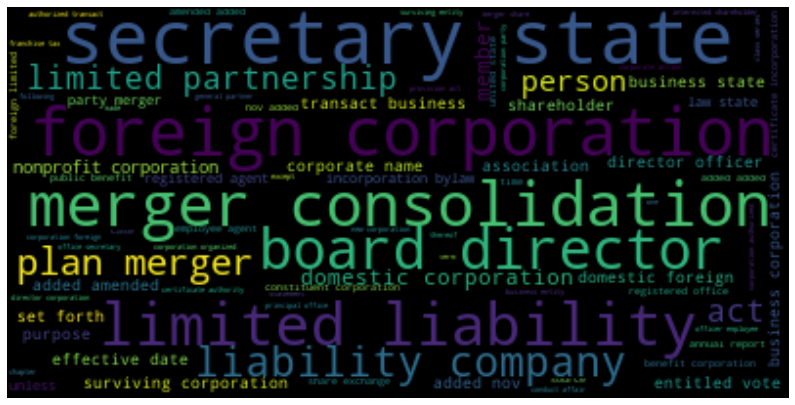

In [343]:
WordCloudAllState("Merger")

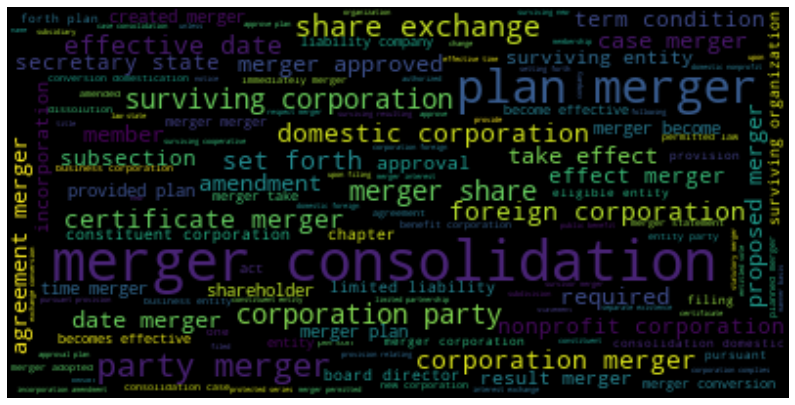

In [355]:
clean_text = df_merger.tenword.apply(fix_Text_wo_number)
text_wc = " ".join(item for item in clean_text)
wordcloud = WordCloud(background_color="black", max_words = 3000).generate(text_wc)
plt.figure(figsize = (14, 13))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show() 

In [387]:
def getTopWordAllStateNew(df_merger):
    clean_text = df_merger.tenword.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
    df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
    array = df.Word
    return array

In [388]:
def getTopTenWordForEachStateNew(df_merger):
    dict_data = {}
    sort_orders = {}
    array = []
    #get 2 columns "state" + 'tenword'
    df_merger = df_merger.loc[:, ['State', 'tenword']]
    #groupby state
    df = df_merger.groupby('State')
    # apply clean_text on tenwords
    for group in df.groups:
        clean_text = df.get_group(group).tenword.apply(fix_Text_wo_number)
        text_wc = " ".join(item for item in clean_text)
        sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
        temp_df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
        array = temp_df.Word
        dict_data.update({group:array})
    return dict_data

In [391]:
dict_data = getTopTenWordForEachStateNew(df_merger)
top_ten = getTopWordAllStateNew(df_merger)
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

             state  correlation
0   alabama         0.3        
1   alaska          0.6        
2   arizona         0.2        
3   california      0.1        
4   colorado        0.0        
5   connecticut     0.6        
6   delaware        0.4        
7   florida         0.5        
8   georgia         0.1        
9   hawaii          0.7        
10  idaho           0.3        
11  illinois        0.6        
12  indiana         0.4        
13  iowa            0.6        
14  kansas          0.3        
15  kentucky        0.5        
16  louisiana       0.7        
17  maine           0.5        
18  maryland        0.3        
19  massachusetts   0.3        
20  michigan        0.8        
21  minnesota       0.6        
22  mississippi     0.4        
23  missouri        0.5        
24  montana         0.4        
25  nebraska        0.6        
26  nevada          0.4        
27  new-hampshire   0.3        
28  new-mexico      0.6        
29  new-york        0.6        
30  newj

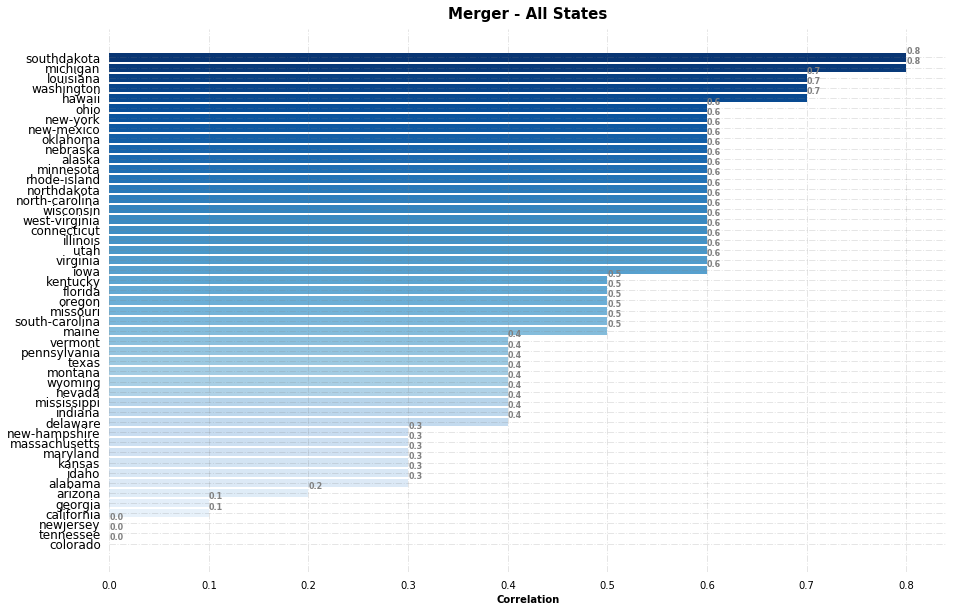

In [392]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Merger - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## VI. Find Keyword in the first 10 words

In [394]:
def FindWord(df_merger):
    text = df_merger.Law
    text = text.lower();
    text = text.split('merger')
    text_before_merger = text[0].split(' ')
    if len(text_before_merger) > 10 :
        #merger was in someplace at the end of law
        return 0
    #merger was in someplace at the begining of law (first 10 words)
    return 1

In [395]:
df_merger['Merger_Position'] = df_merger.apply(FindWord, axis = 1)

In [397]:
df_merger.head(20)

,Article,Law,Merger,State,tenword,Merger_Position
0,Section 10-3A-20 - General powers.,"Section 10-3A-20General powers. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§5.)",True,alabama,[],0
1,Section 10-3A-100 - Procedure for merger.,"Section 10-3A-100Procedure for merger. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§41.)",True,alabama,[section 10-3a-100procedure for merger . all provisions of title 10 have been repealed or],1
2,Section 10-3A-102 - Approval of merger or consolidation.,"Section 10-3A-102Approval of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§43.)",True,alabama,[section 10-3a-102approval of merger or consolidation. all provisions of title 10 have been],1
3,Section 10-3A-103 - Articles of merger or consolidation.,"Section 10-3A-103Articles of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§44.)",True,alabama,[section 10-3a-103articles of merger or consolidation. all provisions of title 10 have been],1
4,Section 10-3A-104 - Effect of merger or consolidation.,"Section 10-3A-104Effect of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§45.)",True,alabama,[section 10-3a-104effect of merger or consolidation. all provisions of title 10 have been],1
5,Section 10-3A-105 - Merger or consolidation of domestic and foreign corporations.,"Section 10-3A-105Merger or consolidation of domestic and foreign corporations. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§46.)",True,alabama,[section 10-3a-105 merger or consolidation of domestic and foreign corporations. all provisions],1
6,Section 10-3A-180 - Merger of foreign corporation authorized to conduct affairs in Alabama.,"Section 10-3A-180Merger of foreign corporation authorized to conduct affairs in Alabama. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§76.)",True,alabama,[section 10-3a-180 merger of foreign corporation authorized to conduct affairs in alabama.],1
7,Sec. 10.20.016. Defense of ultra vires.,"(a) An act of a corporation and a conveyance or transfer of real or personal property to or by a corporation is not invalid because the corporation did not have capacity or power to perform the act or to convey or receive the property. However, lack of capacity or power may be asserted as provided in this section. (b) The assertion may be made in a proceeding by a member or director against the corporation to enjoin the performance of an act or the transfer of real or personal property by or to the corporation. If the unauthorized act or transfer sought to be enjoined is being or is to be performed or made under a contract to which the corporation is a party, the court may, if the parties to the contract are parties to the proceeding and if the court considers it equitable, set aside and enjoin the performance of the contract. In so doing the court may allow compensation to the corporation or to the other parties to the contract for the loss or damage sustained by either of them resulting from the action of the court in setting aside and enjoining the performance of the contract. The court may not award anticipated profits to be derived from the performance of the contract as a loss or damage sustained. (c) The assertion may be made in a proceeding by the corporation, whether acting directly or through a receiver, trustee, or other legal representative, or through members in a represent

## VI. N-Gram words association compare

In [171]:
# Sec. 10.20.236. Adoption of plan of merger or consolidation - Alaska
text = df_merger.loc[[10], ['Law']]
print(text)

In [130]:
vectorizer = CountVectorizer(binary=True, ngram_range=(6,6))

In [172]:
vectorizer.fit(text.Law)

CountVectorizer(analyzer='word', binary=True, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(6, 6), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [183]:
vectorizer.get_feature_names()[:200]

['adopt resolution approving the proposed plan',
 'adopted at meeting of the board',
 'adopted in the manner set out',
 'adopted upon receiving at least two',
 'an annual or special meeting written',
 'and directing that it be submitted',
 'and in the manner provided in',
 'annual or special meeting written notice',
 'approving the proposed plan and directing',
 'are entitled to cast if merging',
 'are entitled to vote the board',
 'at least two thirds of the',
 'at meeting of members entitled to',
 'at meeting of the board of',
 'at the meeting or represented by',
 'at the meeting within the time',
 'be adopted at meeting of the',
 'be adopted in the manner set',
 'be adopted upon receiving at least',
 'be either an annual or special',
 'be given to each member entitled',
 'be submitted to vote at meeting',
 'board of directors of the corporation',
 'by proxy are entitled to cast',
 'cast if merging or consolidating corporation',
 'chapter for the giving of notice',
 'consolidating co

In [174]:
matrix = vectorizer.transform(df_merger.Law)
sums = matrix.sum(axis=1)
sums[:10]

matrix([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [2],
        [0]], dtype=int64)

In [164]:
df_merger['Article'] = df_merger['Article'].astype(str)

In [176]:
pd.DataFrame({
    'matches': np.squeeze(np.asarray(sums)),
    'Law': df_merger.Law,
    'Code': df_merger.State + "-" + df_merger.Article
}).sort_values(by='matches', ascending=False).head(10)

matches  \
10    169       
588   115       
799   112       
272   100       
355   93        
1057  90        
197   58        
930   48        
13    29        
932   26        

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [177]:
word_counts = pd.DataFrame(
    matrix.toarray(), 
    columns=vectorizer.get_feature_names(),
    index= df_merger.State + "-" + df_merger.Article
)

word_counts = word_counts.loc[~(word_counts==0).all(axis=1)]

word_counts = word_counts.replace(0, np.nan) \
    .dropna(axis=1, how='all') \
    .dropna(axis=0, how='all')

word_counts['TOTAL_ngrams_shared'] = word_counts.sum(axis=1)
word_counts = word_counts.sort_values(by='TOTAL_ngrams_shared', ascending=False)
word_counts = word_counts.T

word_counts['TOTAL_bills_used'] = word_counts.sum(axis=1)
word_counts = word_counts.sort_values(by='TOTAL_bills_used', ascending=False)

word_counts.fillna("", inplace=True)

In [178]:
word_counts.head(200)

,alaska-Sec. 10.20.236. Adoption of plan of merger or consolidation.,new-mexico-Section 53-8-42 - Adoption of merger or consolidation.,rhode-island-Section 7-6-45 Approval of merger or consolidation.,kentucky-kentucky_statutes_273-283,maine-13-B §903. Approval of merger or consolidation,washington-24.03.195 Approval of merger or consolidation.,illinois-Article 2 - Nature Of Partnership,southdakota-§ 47-25-8 Corporations having no members entitled to vote--Approval by directors.,alaska-Sec. 10.20.251. Contents of articles of merger or consolidation.,southdakota-§ 47-25-10 Approval of articles of merger or consolidation--Contents of approval--Delivery to secretary of state.,new-mexico-Section 53-8-43 - Articles of merger or consolidation.,kentucky-kentucky_statutes_273-287,rhode-island-Section 7-6-46 Articles of merger or consolidation.,illinois-Article 8 - Directors And Officers,southdakota-§ 47-25-12 Effective date of merger or consolidation.,maine-13-B §904. Articles of merger or consolidation,illinois-Article 25 - Distributions,washington-24.03.200 Articles of merger or consolidation.,virginia-§ 13.1-895. Action on plan of merger,minnesota-Section 317A.613 — Plan Approval.,"michigan-Section 450.2753 Disposition of Property and Assets of Corporation; Disposal of All or Substantially All of Property; Presumption That Corporation Retains Significant Continuing Business Activity; ""Consideration"" Defined; Recommendation of Proposed Transaction; Exceptions; Submission to Shareholders or Members; Approval; Notice of Meeting; Statement; Authorization; Fixing Term or Condition and Consideration; Voting; Abandonment; Distribution.",michigan-Section 450.2703a Plan of Merger; Approval.,southdakota-§ 47-25-9 Abandonment of merger or consolidation plan.,minnesota-Section 317A.621 — Merger Of Wholly Owned Subsidiaries.,west-virginia-§31E-11-1102. Action on Plan of Merger,connecticut-Section 33-1156 - Action on plan of merger.,louisiana-RS 12:243 - Merger or consolidation procedure,southdakota-§ 47-25-7 Two-thirds vote required for approval.,illinois-Article 2 - Formation of Benefit Corporations,illinois-Article 55 - Miscellaneous,new-york-903 - Approval of Plan.,virginia-§ 13.1-896. Articles of merger,illinois-Article 5 - Office And Agent,texas-Section 22.164. Vote Required to Approve Fundamental Action,illinois-Article 4 - Name,illinois-Article 3 - Corporate Purposes,texas-Section 22.253. Meeting of Members; Notice,alaska-Sec. 10.20.241. Abandonment of plan of merger or consolidation.,louisiana-RS 12:1805 - Termination of status,illinois-Article 50 - Fees And Other Matters,illinois-Article 5 - Office And Agent,arizona-§ 10-11103 Action on plan,oklahoma-§18-1090.3. Business combinations with interested shareholders.,louisiana-RS 12:1804 - Election of status; corporate name,north-carolina-§ 55A-3-03 - Emergency powers.,new-mexico-Section 53-8-44 - Effect of merger or consolidation.,"nebraska-21-29,124 Approval or abandonment of merger or consolidation by members of constituent limited cooperative association.",mississippi-§ 79-11-153. Emergency powers of board of directors; notice during emergency; officers may be deemed directors during emergency; effect of emergency corporate action; emergency defined,nebraska-21-1929 Emergency powers.,"nebraska-21-29,123 Notice and action on plan of merger or consolidation by constituent limited cooperative association.","nebraska-21-29,122 Merger or consolidation.",missouri-Section 355.136 Emergency powers.,nebraska-21-228 Emergency powers.,alaska-Sec. 10.20.216. Merger.,ohio-Section 1702.41 - Merger or consolidation into domestic corporation.,tennessee-§ 48-53-103. Emergency powers.,wyoming-Section 17-19-303 - Emergency Powers.,west-virginia-§31E-3-303. Emergency Powers,washington-24.03.210 Effect of merger or consolidation.,washington-24.03.185 Procedure for merger.,virginia-§ 13.1-894. Merger,virginia-§ 13.1-827. Emergency powers,utah-Section 1102 - Action on plan of merger.,utah-Section 303 - Emer